In [1]:
import matplotlib.pyplot as plt
import nivapy3 as nivapy
import pandas as pd
import numpy as np
import seaborn as sns
import utils
import statsmodels.api as sm

# Interactive plotting
%matplotlib widget

plt.style.use("ggplot")

## Selection of Key Chemical Species

This notebook aims to verify the following aspects for data consistency and calculation feasibility:

* Determine whether TSM (Total Suspended Matter) and SPM (Suspended Particulate Matter) are equivalent, noting that SPM is also referred to as STS (suspendert tørrstoff).
* Assess whether POC (Particulate Organic Carbon) can be calculated with the available data.
* Check whether DOC (Dissolved Organic Carbon) can be used as a substitute for TOC (Total Organic Carbon).
* Check if NO3 is quite higher than NH4, and if so, compute DIN.
* Check the relationship between sensor-measured CDOM and UV Abs 410 or Farge from the river.IN.

### 1. User Input 

In [2]:
wc_df = pd.read_csv('../../data/river/water_chem/cleaned_niva/dremmen_glomma_numed_wc_flagged_2024.csv')
wc_df['sample_date'] = pd.to_datetime(wc_df['sample_date'])
wc_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1632 entries, 0 to 1631
Data columns (total 34 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   station_id                    1632 non-null   int64         
 1   station_code                  1632 non-null   object        
 2   station_name                  1632 non-null   object        
 3   sample_date                   1632 non-null   datetime64[ns]
 4   DOC_mg/L C                    412 non-null    float64       
 5   outlier_DOC_mg/L C            412 non-null    object        
 6   Farge_mg Pt/l                 174 non-null    float64       
 7   outlier_Farge_mg Pt/l         174 non-null    object        
 8   NH4-N_µg/l                    1461 non-null   float64       
 9   outlier_NH4-N_µg/l            1461 non-null   object        
 10  NO3-N_µg/l                    1584 non-null   float64       
 11  outlier_NO3-N_µg/l            

### 2. Quick visual inspection 

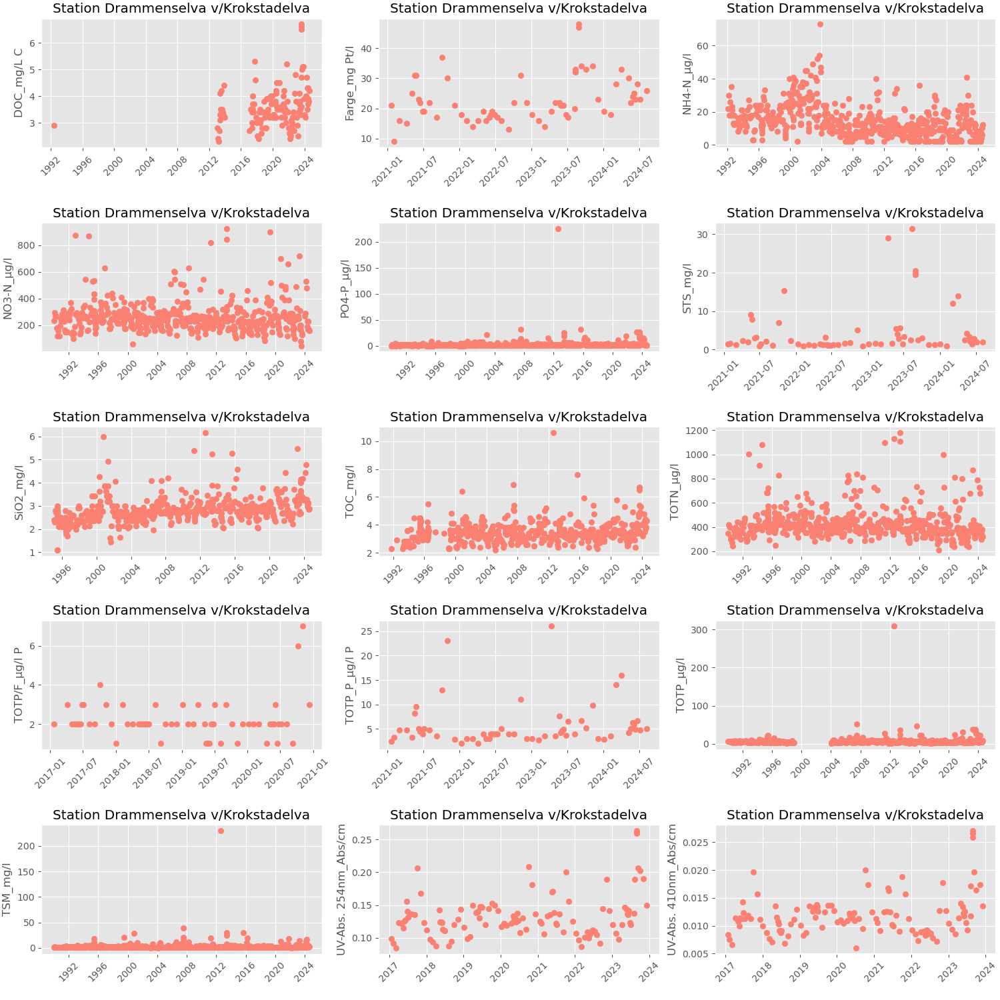

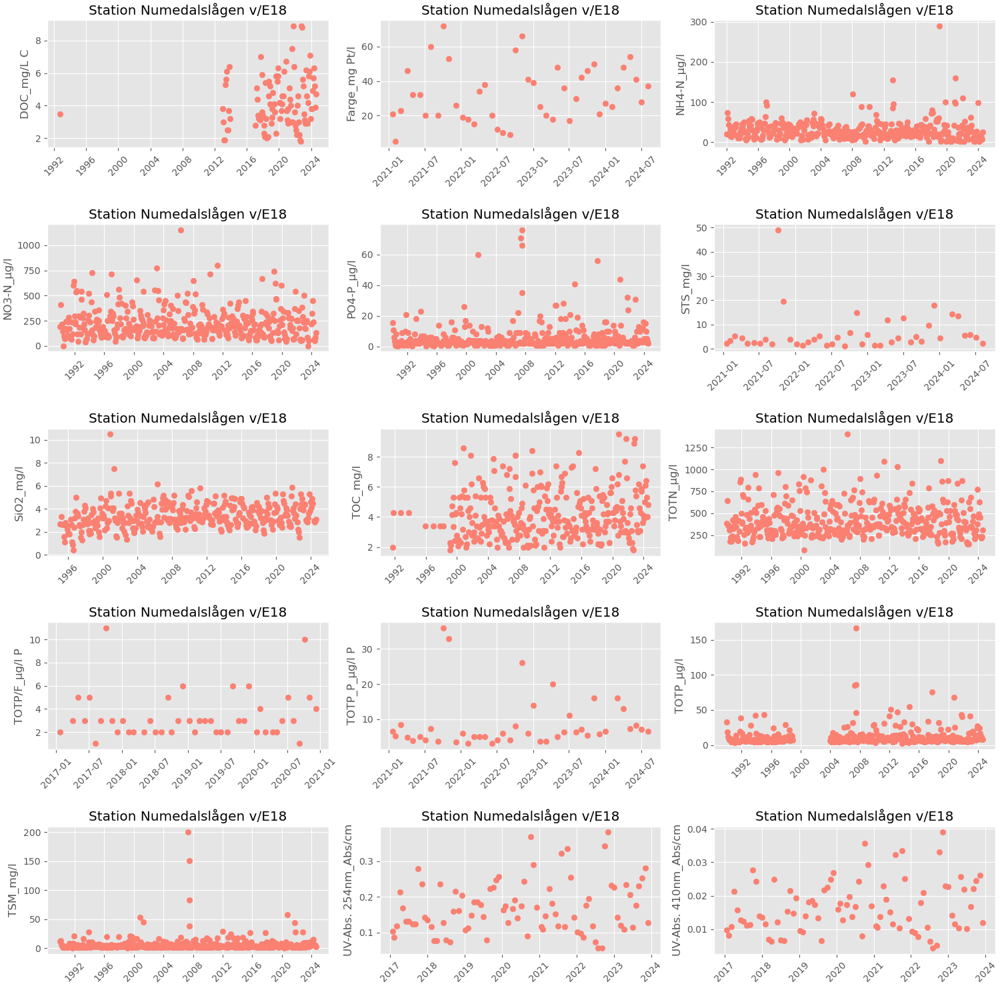

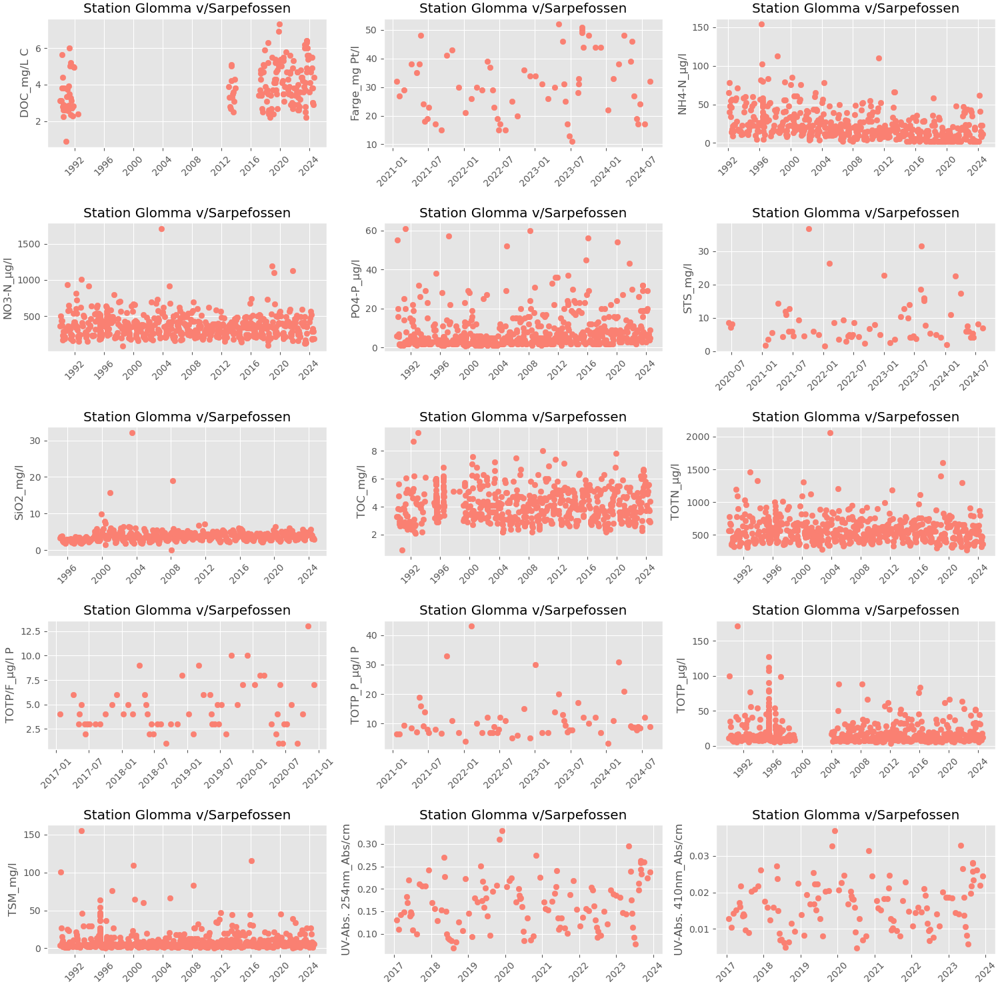

In [3]:
# Station Variable Scatter Plots
stations = wc_df["station_name"].unique()

num_cols = 3

for station in stations:
    station_df = wc_df[wc_df["station_name"] == station]
    
    variables = [col for col in station_df.columns 
                 if col not in ["station_id", "station_code", "station_name", "sample_date"] 
                 and "outlier" not in col]
    
    num_rows = (len(variables) + num_cols - 1) // num_cols
    
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 3), constrained_layout=True)
    
    axes = axes.flatten()
    
    for i, var in enumerate(variables):
        ax = axes[i]
        ax.scatter(station_df["sample_date"], station_df[var], marker='o', color='salmon')
        ax.set_title(f"Station {station}")
        ax.set_xlabel(" ")
        ax.set_ylabel(var)
        ax.tick_params(axis='x', rotation=45)
       
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])
    
    plt.show()

In [4]:
wc_df

,station_id,station_code,station_name,sample_date,DOC_mg/L C,outlier_DOC_mg/L C,Farge_mg Pt/l,outlier_Farge_mg Pt/l,NH4-N_µg/l,outlier_NH4-N_µg/l,...,TOTP_P_µg/l P,outlier_TOTP_P_µg/l P,TOTP_µg/l,outlier_TOTP_µg/l,TSM_mg/l,outlier_TSM_mg/l,UV-Abs. 254nm_Abs/cm,outlier_UV-Abs. 254nm_Abs/cm,UV-Abs. 410nm_Abs/cm,outlier_UV-Abs. 410nm_Abs/cm
0,40352,DRA1,Drammenselva v/Krokstadelva,1990-01-11 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,6.0,False,0.80,False,NaN,NaN,NaN,NaN
1,40352,DRA1,Drammenselva v/Krokstadelva,1990-02-12 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,7.0,False,2.00,False,NaN,NaN,NaN,NaN
2,40352,DRA1,Drammenselva v/Krokstadelva,1990-03-13 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,6.0,False,1.40,False,NaN,NaN,NaN,NaN
3,40352,DRA1,Drammenselva v/Krokstadelva,1990-04-18 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,5.0,False,1.30,False,NaN,NaN,NaN,NaN
4,40352,DRA1,Drammenselva v/Krokstadelva,1990-05-21 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,6.0,False,1.70,False,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1627,40356,GLO1,Glomma v/Sarpefossen,2024-06-03 04:20:00,3.0,False,19.0,False,8.0,False,...,7.8,False,7.9,False,4.42,False,NaN,NaN,NaN,NaN
1628,40356,GLO1,Glomma v/Sarpefossen,2024-06-12 15:15:00,3.0,False,17.0,False,13.0,False,...,9.0,False,11.0,False,1.00,False,NaN,NaN,NaN,NaN
1629,40356,GLO1,Glomma v/Sarpefossen,2024-06-20 11:30:00,3.8,False,24.0,False,9.0,False,...,8.5,False,11.0,False,4.63,False,NaN,NaN,NaN,NaN
1630,40356,GLO1,Glomma v/Sarpefossen,2024-07-15 15:20:00,2.9,False,17.0,False,23.0,False,...,12.0,False,18.0,False,6.58,False,NaN,NaN,NaN,NaN


### 3. TSM vs STS

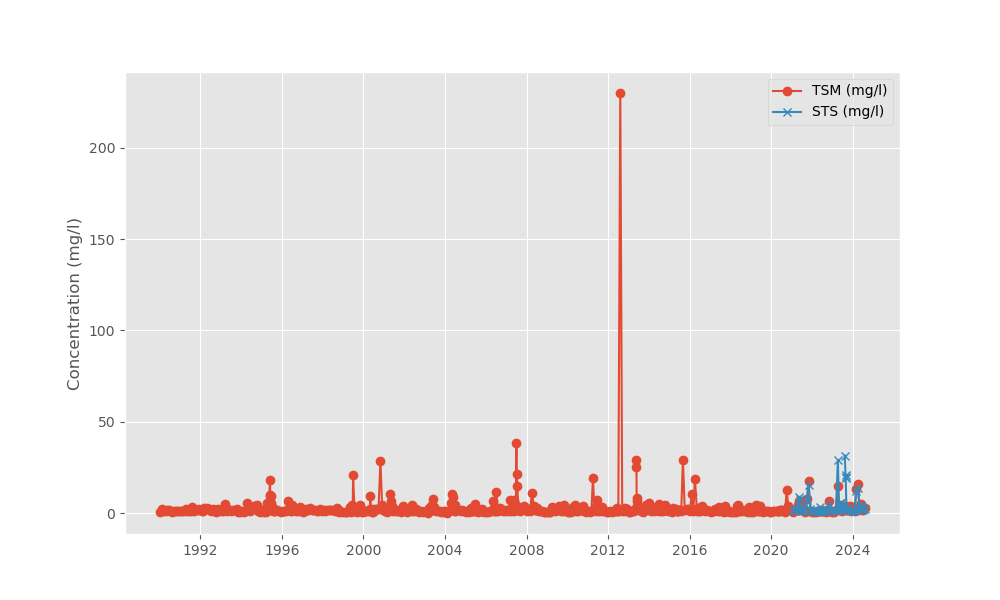

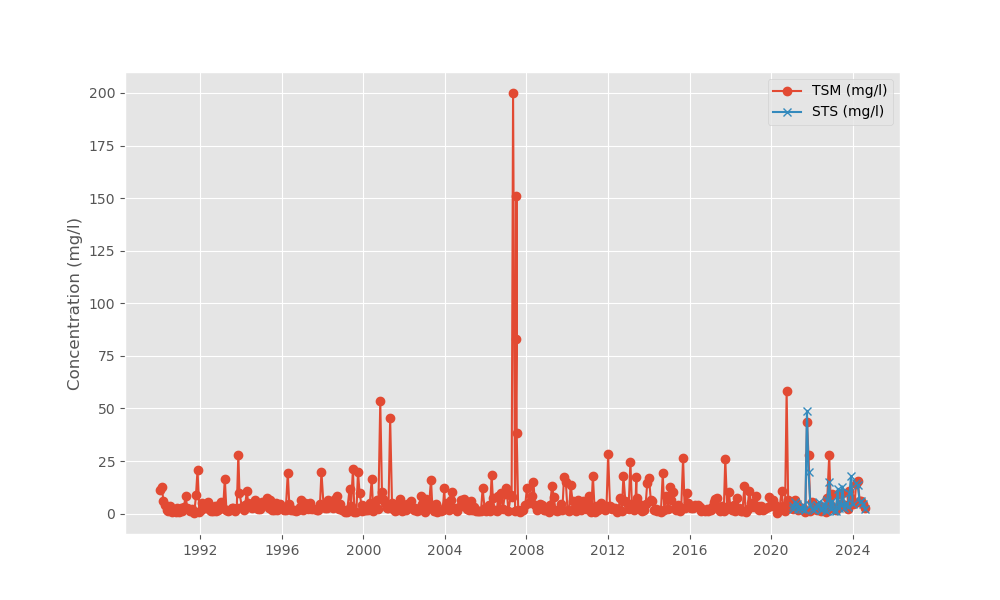

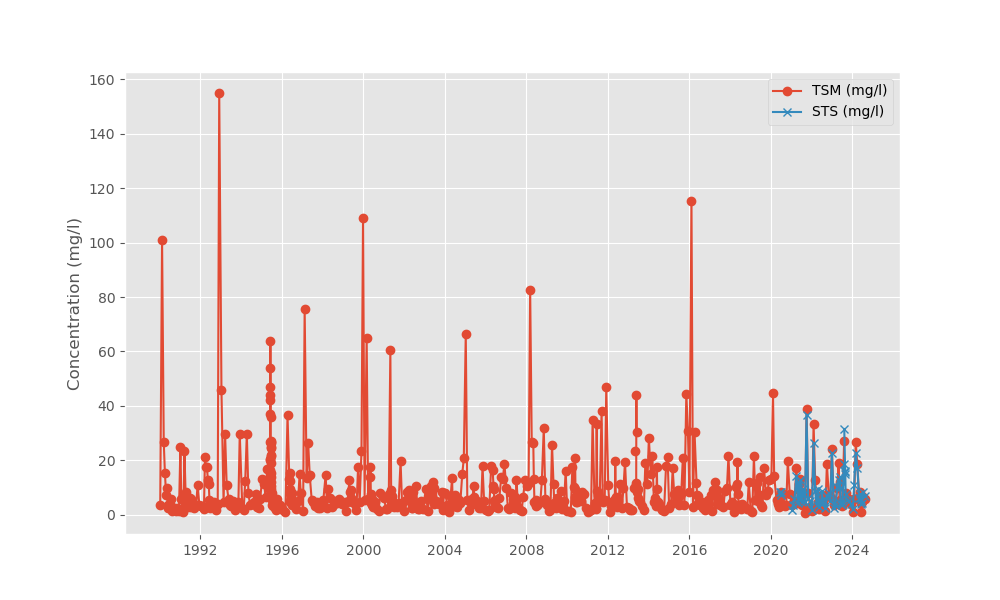

In [5]:
# Plot TSM and STS for each station
stations = wc_df['station_code'].unique()

for station in stations:
    station_df = wc_df[wc_df['station_code'] == station]
    
    plt.figure(figsize=(10,6))
    plt.plot(station_df['sample_date'], station_df['TSM_mg/l'], label='TSM (mg/l)', marker='o')
    plt.plot(station_df['sample_date'], station_df['STS_mg/l'], label='STS (mg/l)', marker='x') 
    
    plt.xlabel(' ')
    plt.ylabel('Concentration (mg/l)')
    plt.legend()
    plt.grid(True)
    plt.show()

**Øyvind:** The main difference between the methods is that STS uses "regular" glass fiber filters: GF/C (0.45 µm), and the weighing of the filters takes place on a "regular" analytical weight that weighs grams with 4 (or maybe 5) decimal places. TSM uses nucleopore capillary filters, which have smaller pore size (0.2 µm? - not confirmed with the lab!) than the glass fiber filters. Filters are weighed on a micro-weight, which measures the weight in milligrams with several decimal places. In principle, TSM values should be higher than STS due to smaller filter pore size.

**Leah:** We can just use TSM. We have more data and TSM is moreaccurate than STS.

### 4. DOC vs TOC

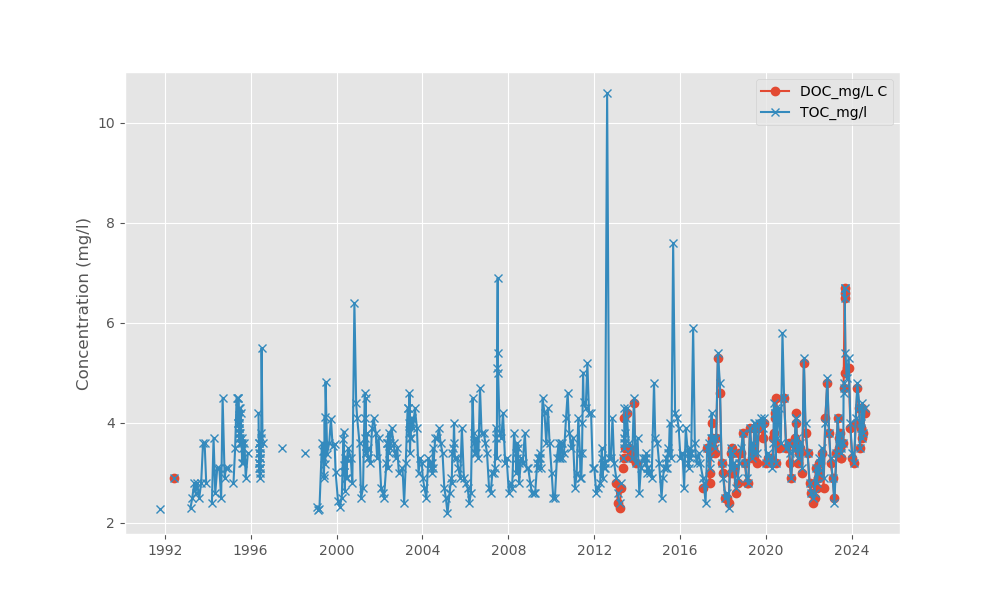

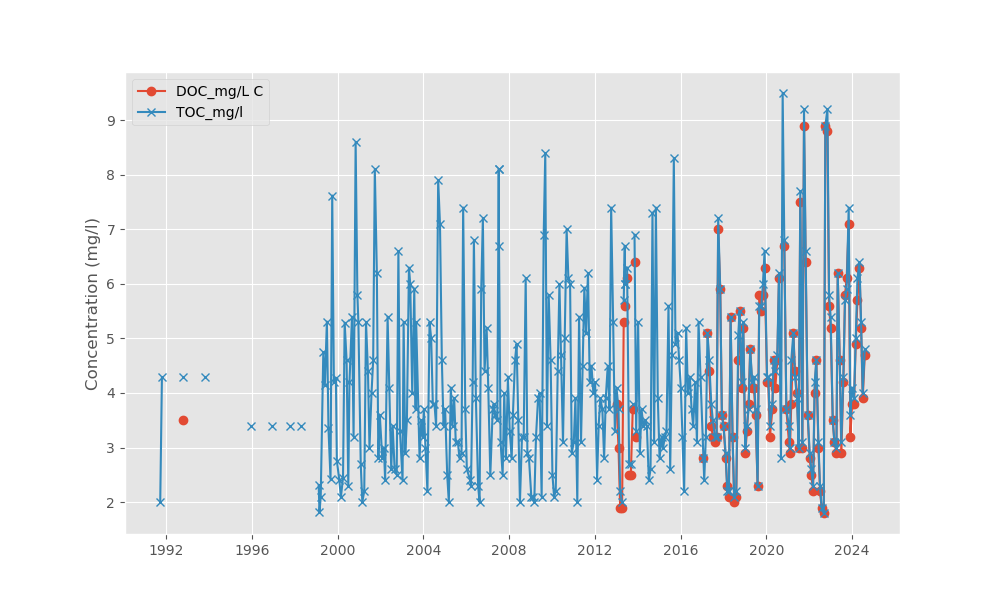

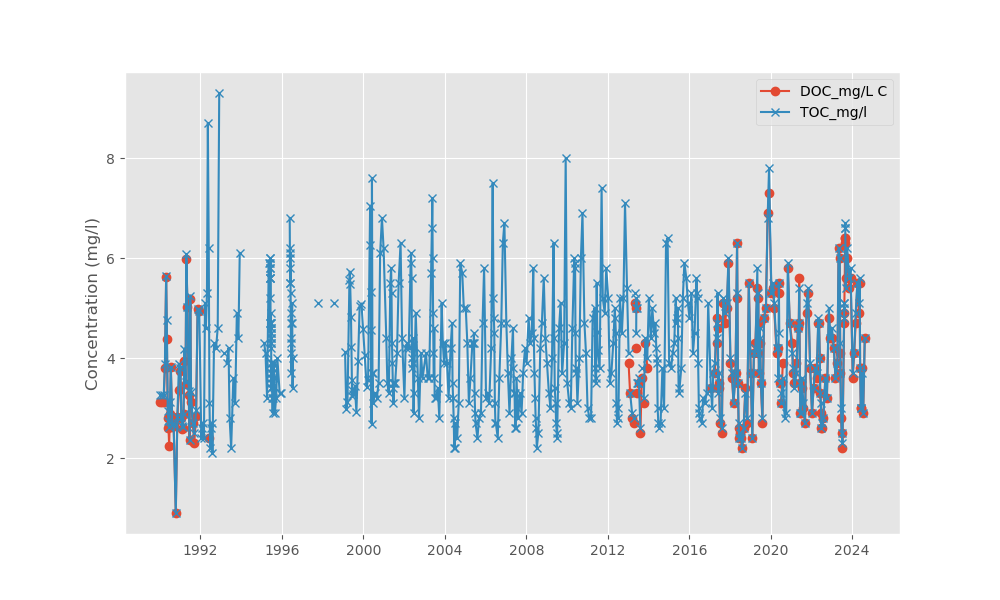

In [6]:
# Plot DOC and TOC for each station
for station in stations:
    station_df = wc_df[wc_df['station_code'] == station]
    
    plt.figure(figsize=(10,6))
    plt.plot(station_df['sample_date'], station_df['DOC_mg/L C'], label='DOC_mg/L C', marker='o')
    plt.plot(station_df['sample_date'], station_df['TOC_mg/l'], label='TOC_mg/l', marker='x')
    
    plt.xlabel(' ')
    plt.ylabel('Concentration (mg/l)')
    plt.legend()
    plt.grid(True)
    plt.show()

**Leah:** Looks like DOC basically == TOC in all rivers and that POC is really low. Could you quickly work out the average ratio between DOC and TOC and make a note of it for all 3 rivers? Then lets justify how low that is for assuming that TOC = DOC and just using TOC (given it has a longer and more continuous series).

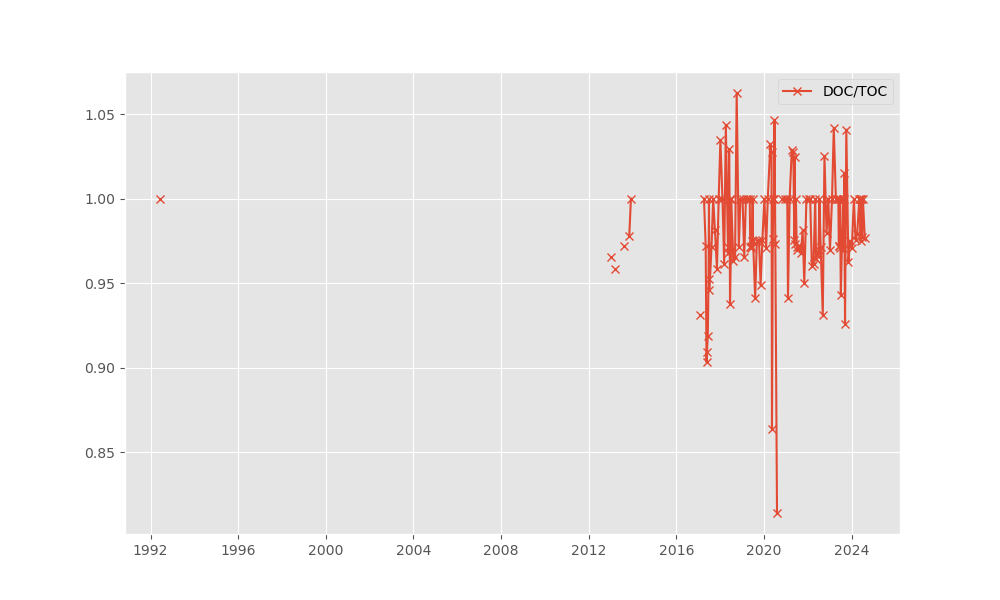

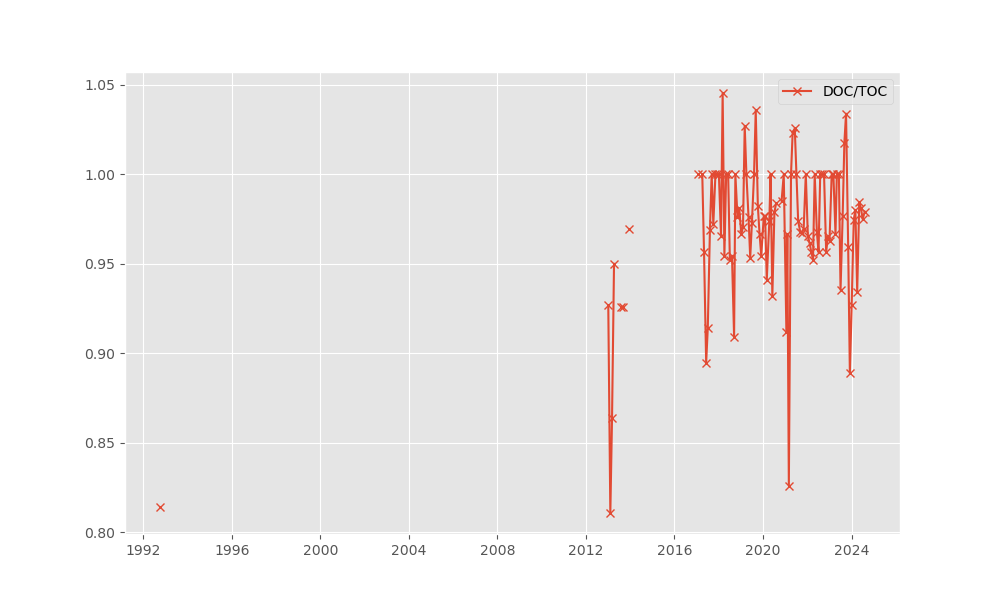

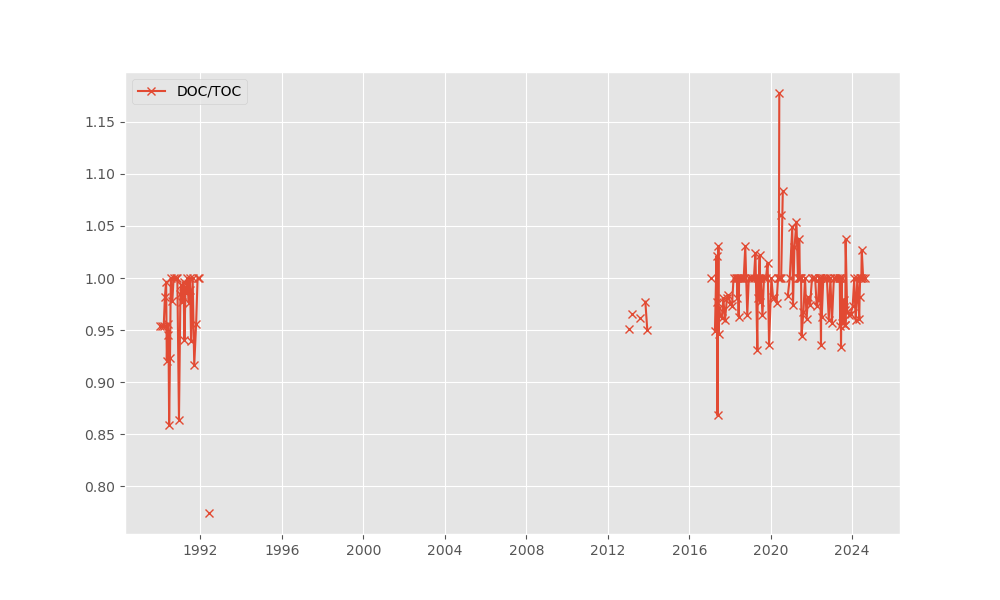

In [7]:
wc_df['DOC/TOC'] = wc_df['DOC_mg/L C'] / wc_df['TOC_mg/l']

for station in stations:
    station_df = wc_df[wc_df['station_code'] == station]
    
    plt.figure(figsize=(10,6))
    plt.plot(station_df['sample_date'], station_df['DOC/TOC'], label='DOC/TOC', marker='x')
    
    plt.xlabel(' ')
    plt.ylabel(' ')
    plt.legend()
    plt.grid(True)
    plt.show()

In [8]:
ratios = wc_df.groupby('station_code')['DOC/TOC'].mean().reset_index()
ratios

,station_code,DOC/TOC
0,DRA1,0.981426
1,GLO1,0.983659
2,NUM1,0.968519


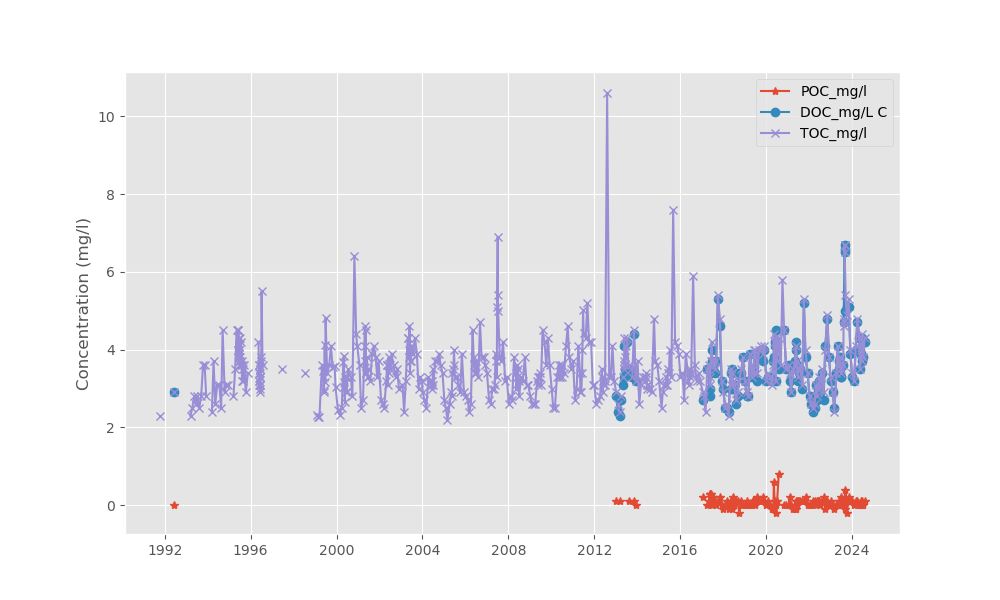

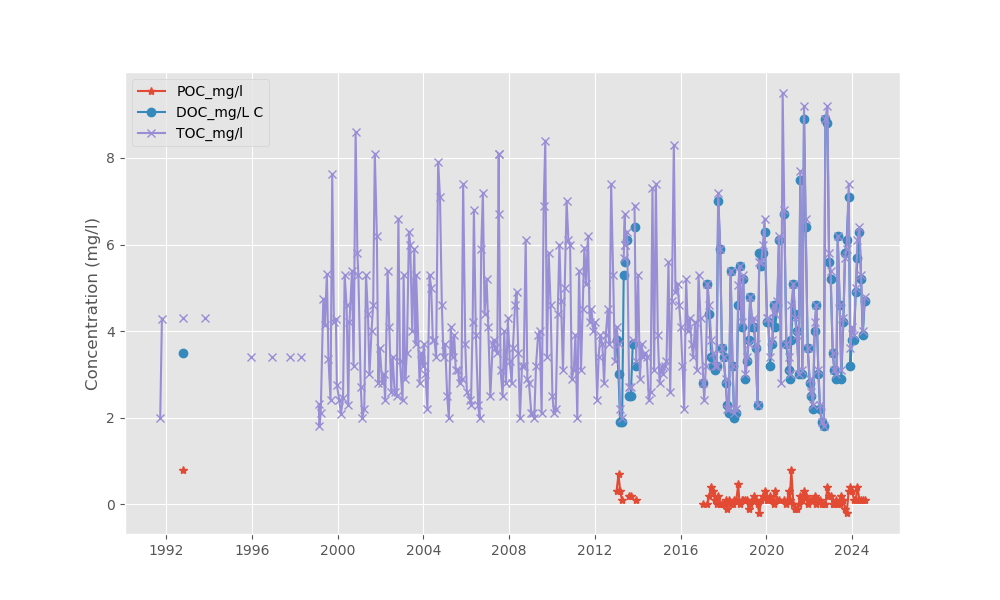

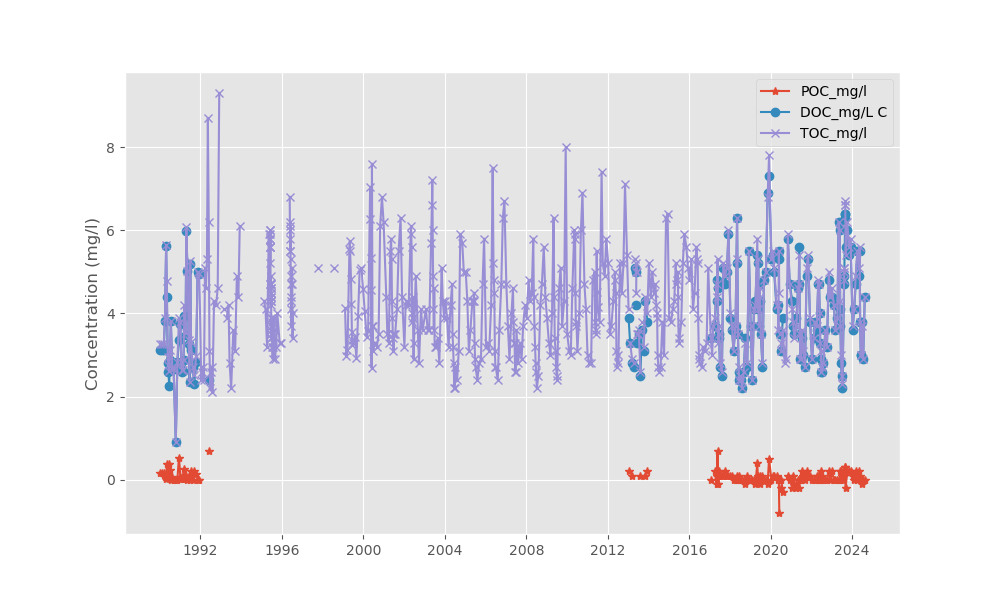

In [9]:
wc_df['POC_mg/l'] = wc_df['TOC_mg/l'] - wc_df['DOC_mg/L C']

for station in stations:
    station_df = wc_df[wc_df['station_code'] == station]
    
    plt.figure(figsize=(10,6))
    plt.plot(station_df['sample_date'], station_df['POC_mg/l'], label='POC_mg/l', marker='*')
    plt.plot(station_df['sample_date'], station_df['DOC_mg/L C'], label='DOC_mg/L C', marker='o')
    plt.plot(station_df['sample_date'], station_df['TOC_mg/l'], label='TOC_mg/l', marker='x')
    
    plt.xlabel(' ')
    plt.ylabel('Concentration (mg/l)')
    plt.legend()
    plt.grid(True)
    plt.show()

**Leah:** Incredibly low POC values, as we thought (2-4% of TOC), so that's good justification for just looking at TOC.

### 5. TOTP vs TOTP/F

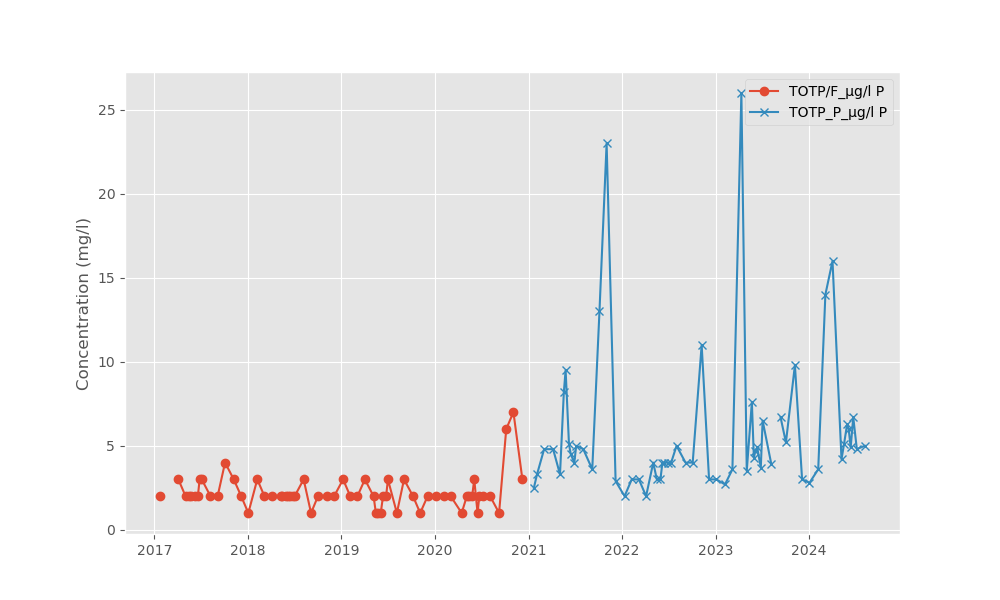

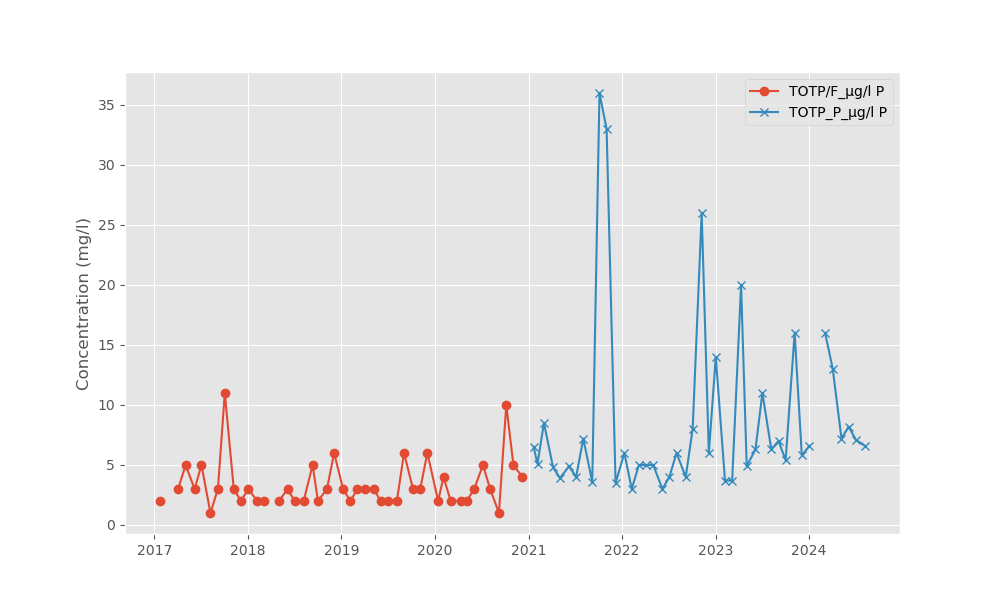

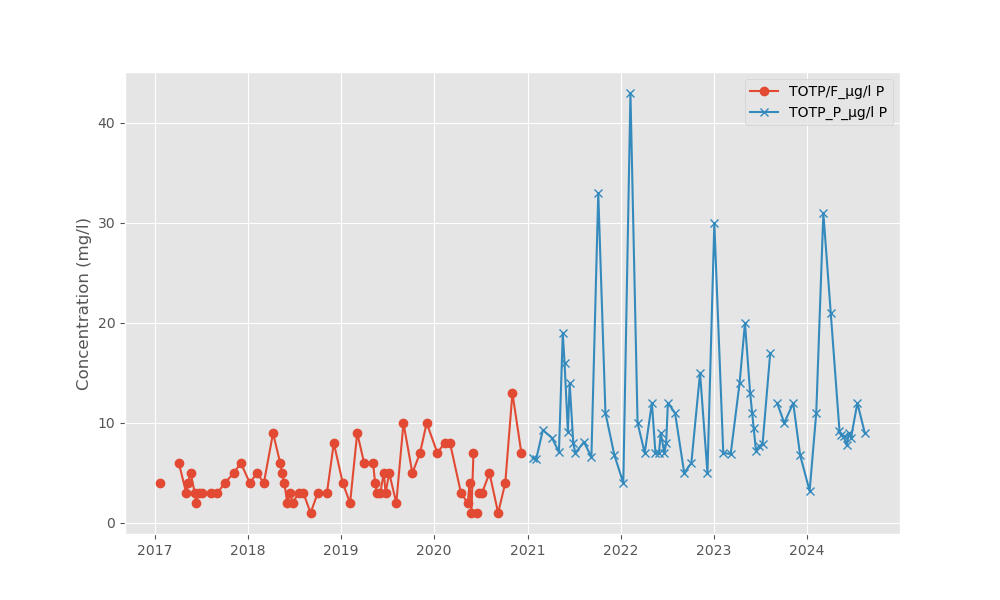

In [10]:
for station in stations:
    station_df = wc_df[wc_df['station_code'] == station]
    
    plt.figure(figsize=(10,6))
    plt.plot(station_df['sample_date'], station_df['TOTP/F_µg/l P'], label='TOTP/F_µg/l P', marker='o')
    plt.plot(station_df['sample_date'], station_df['TOTP_P_µg/l P'], label='TOTP_P_µg/l P', marker='x')
    
    plt.xlabel(' ')
    plt.ylabel('Concentration (mg/l)')
    plt.legend()
    plt.grid(True)
    plt.show()

### 6. NH4 vs NO3

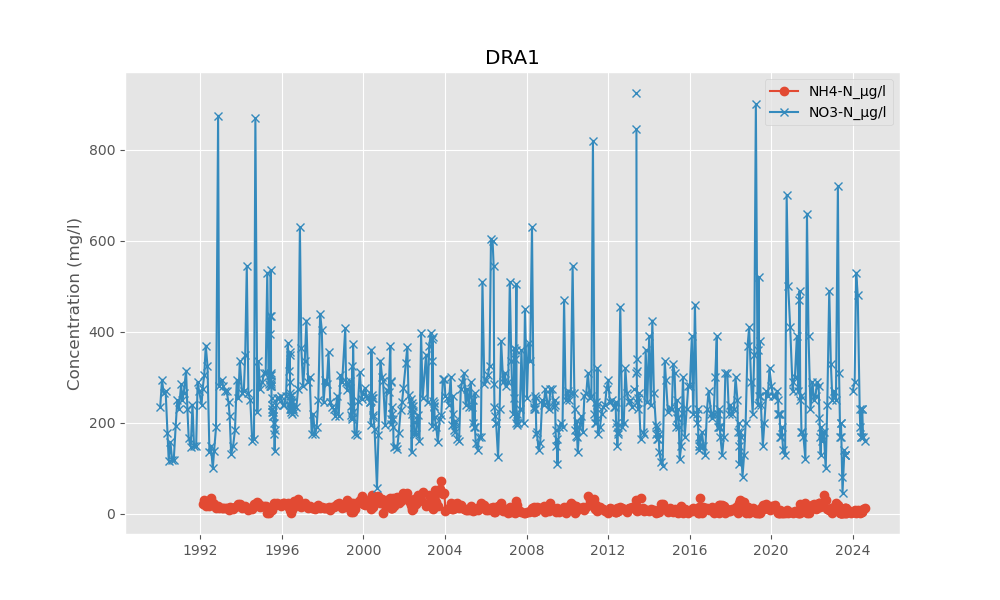

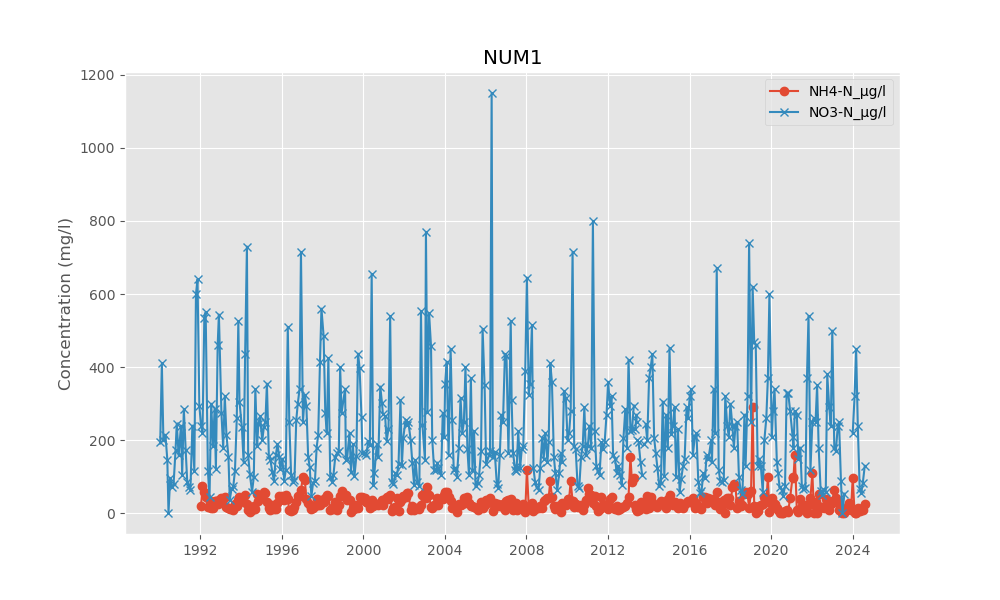

/tmp/ipykernel_4218/1229062730.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,6))


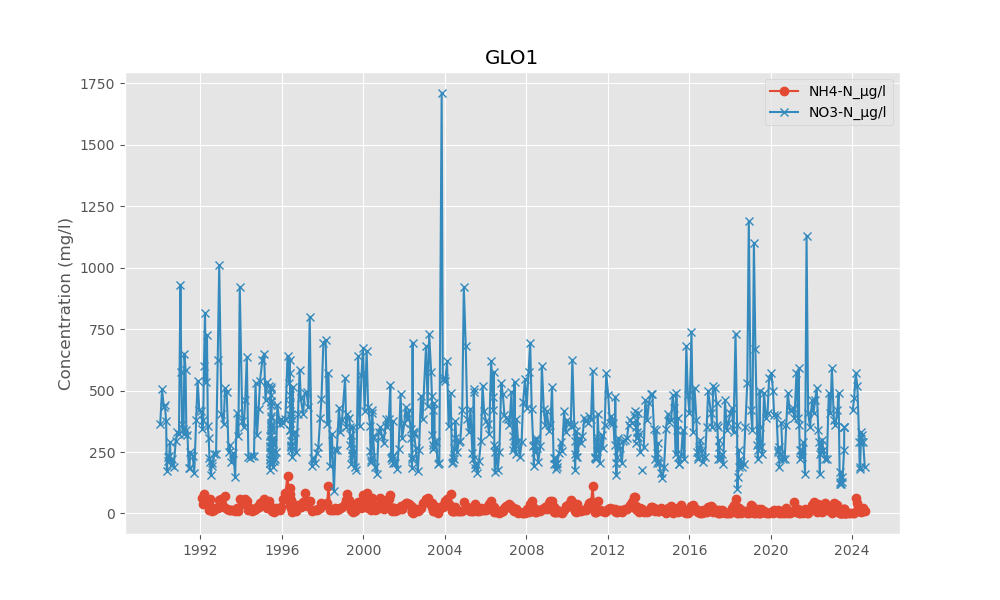

In [11]:
for station in stations:
    station_df = wc_df[wc_df['station_code'] == station]
    
    plt.figure(figsize=(10,6))
    plt.plot(station_df['sample_date'], station_df['NH4-N_µg/l'], label='NH4-N_µg/l', marker='o')
    plt.plot(station_df['sample_date'], station_df['NO3-N_µg/l'], label='NO3-N_µg/l', marker='x')
    
    plt.xlabel(' ')
    plt.title(station)
    plt.ylabel('Concentration (mg/l)')
    plt.legend()
    plt.grid(True)
    plt.show()

**Note:** NO3 values are quite higher compared to NH4, particularly in Dram and Glomma. There are a few exeptions for Num, where NH4 levels are close to NO3, although in general NH4<<NO3, soo we could just summarize those to DIN for simplification.

In [12]:
wc_df['DIN_μg/l'] = wc_df['NH4-N_µg/l'] + wc_df['NO3-N_µg/l']  

# Assign outliers: If NO3-N_µg/l is an outlier, mark DIN_μg/l as an outlier too
if 'outlier_NO3-N_µg/l' in wc_df.columns:
    wc_df['outlier_DIN_μg/l'] = wc_df['outlier_NO3-N_µg/l']  # Copy NO3 outliers

# Drop unnecessary columns 
wc_df = wc_df.drop(columns=['NH4-N_µg/l', 'NO3-N_µg/l', 'STS_mg/l', 'DOC/TOC', 'POC_mg/l', 'DOC_mg/L C', 
                            'outlier_NH4-N_µg/l', 'outlier_NO3-N_µg/l', 'outlier_STS_mg/l', 'outlier_DOC_mg/L C'])
wc_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1632 entries, 0 to 1631
Data columns (total 28 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   station_id                    1632 non-null   int64         
 1   station_code                  1632 non-null   object        
 2   station_name                  1632 non-null   object        
 3   sample_date                   1632 non-null   datetime64[ns]
 4   Farge_mg Pt/l                 174 non-null    float64       
 5   outlier_Farge_mg Pt/l         174 non-null    object        
 6   PO4-P_µg/l                    1558 non-null   float64       
 7   outlier_PO4-P_µg/l            1558 non-null   object        
 8   SiO2_mg/l                     1353 non-null   float64       
 9   outlier_SiO2_mg/l             1353 non-null   object        
 10  TOC_mg/l                      1385 non-null   float64       
 11  outlier_TOC_mg/l              

In [13]:
wc_df.keys()

Index(['station_id', 'station_code', 'station_name', 'sample_date',
       'Farge_mg Pt/l', 'outlier_Farge_mg Pt/l', 'PO4-P_µg/l',
       'outlier_PO4-P_µg/l', 'SiO2_mg/l', 'outlier_SiO2_mg/l', 'TOC_mg/l',
       'outlier_TOC_mg/l', 'TOTN_µg/l', 'outlier_TOTN_µg/l', 'TOTP/F_µg/l P',
       'outlier_TOTP/F_µg/l P', 'TOTP_P_µg/l P', 'outlier_TOTP_P_µg/l P',
       'TOTP_µg/l', 'outlier_TOTP_µg/l', 'TSM_mg/l', 'outlier_TSM_mg/l',
       'UV-Abs. 254nm_Abs/cm', 'outlier_UV-Abs. 254nm_Abs/cm',
       'UV-Abs. 410nm_Abs/cm', 'outlier_UV-Abs. 410nm_Abs/cm', 'DIN_μg/l',
       'outlier_DIN_μg/l'],
      dtype='object')

### 7. Glomma Farge vs sensor 

**Leah:** The main reason to  look at UV-Abs is to quality control the CDOM data. Hopefully there is an extremely good correlation with UV-Abs! If not, then one or the other is dodgy... So it's fine if we only have data after 2017. We're not interested in fluxes of UV-Abs to the fjord.

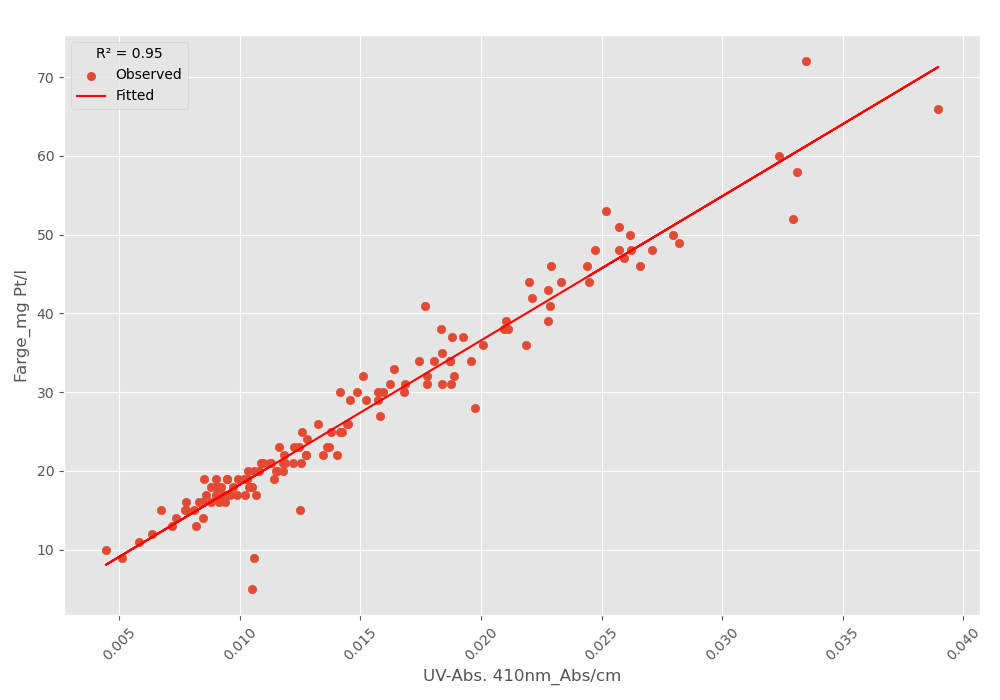

{('Farge_mg Pt/l', 'UV-Abs. 410nm_Abs/cm'): [0.9477900121931774, 1831.2807314777942, -0.05421336099591012]}


In [14]:
# Variables of interest
wc_var_1 = 'Farge_mg Pt/l'
wc_var_2 = 'UV-Abs. 410nm_Abs/cm'

# Initialize dictionary to store model coefficients and R-squared values
model_r2_coeffs = {}

fig, ax = plt.subplots(figsize=(10, 7))
df_reg = wc_df[[wc_var_1, wc_var_2]].dropna()
    
if not wc_df.empty:
    X = sm.add_constant(df_reg[wc_var_2])  # independent variable
    y = df_reg[wc_var_1]  # dependent variable
        
    model = sm.OLS(y, X)
    results = model.fit()
        
    m, c = results.params[wc_var_2], results.params['const']
    model_r2_coeffs[(wc_var_1, wc_var_2)] = [results.rsquared, m, c]
        
    ax.scatter(df_reg[wc_var_2], df_reg[wc_var_1], label='Observed')
    ax.plot(df_reg[wc_var_2], results.fittedvalues, color='red', label='Fitted')
    ax.set_xlabel(wc_var_2)
    ax.set_ylabel(wc_var_1)
    r2 = results.rsquared
    ax.legend(title=f'R² = {r2:.2f}')
    ax.tick_params(axis='x', rotation=45) 
    
plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()

print(model_r2_coeffs)

In [15]:
df_glo = wc_df[wc_df['station_code'].str.contains('GLO')]
df_glo.head()

,station_id,station_code,station_name,sample_date,Farge_mg Pt/l,outlier_Farge_mg Pt/l,PO4-P_µg/l,outlier_PO4-P_µg/l,SiO2_mg/l,outlier_SiO2_mg/l,...,TOTP_µg/l,outlier_TOTP_µg/l,TSM_mg/l,outlier_TSM_mg/l,UV-Abs. 254nm_Abs/cm,outlier_UV-Abs. 254nm_Abs/cm,UV-Abs. 410nm_Abs/cm,outlier_UV-Abs. 410nm_Abs/cm,DIN_μg/l,outlier_DIN_μg/l
1014,40356,GLO1,Glomma v/Sarpefossen,1990-01-10,NaN,NaN,6.0,False,NaN,NaN,...,11.0,False,3.5,False,NaN,NaN,NaN,NaN,NaN,False
1015,40356,GLO1,Glomma v/Sarpefossen,1990-02-12,NaN,NaN,55.0,False,NaN,NaN,...,100.0,False,100.8,True,NaN,NaN,NaN,NaN,NaN,False
1016,40356,GLO1,Glomma v/Sarpefossen,1990-03-14,NaN,NaN,20.0,False,NaN,NaN,...,35.0,False,26.8,False,NaN,NaN,NaN,NaN,NaN,False
1017,40356,GLO1,Glomma v/Sarpefossen,1990-04-04,NaN,NaN,16.0,False,NaN,NaN,...,27.0,False,15.3,False,NaN,NaN,NaN,NaN,NaN,False
1018,40356,GLO1,Glomma v/Sarpefossen,1990-04-26,NaN,NaN,5.5,False,NaN,NaN,...,15.0,False,7.1,False,NaN,NaN,NaN,NaN,NaN,False


In [16]:
sensor_df = pd.read_csv("../../data/river/sensors/daily_glomma_sensor_data_2024-08-28_cleaned_manualy.csv")
# sensor_df = sensor_df.drop('Unnamed: 0', axis=1)
sensor_df['Date'] = pd.to_datetime(sensor_df['Date'])
sensor_df.set_index('Date', inplace=True)
sensor_df.head()

,CDOMdigitalFinal (µg/L),PhValue_Avg (-),Temp_water_Avg (degC),CondValue_Avg (µS/cm),Turbidity_Avg (NTU),Salinity_Avg (-)
Date,,,,,,
2023-02-02,76.000,NaN,0.0900,35.350,8.1700,0.019
2023-02-03,75.430,7.5330,0.0595,34.580,8.1200,0.019
2023-02-04,74.765,7.3875,0.0300,33.615,8.8900,0.018
2023-02-05,74.645,7.2770,0.0635,32.585,7.8885,0.017
2023-02-06,73.385,7.2950,0.1325,32.685,6.1120,0.018


In [17]:
df_glo['sample_date'] = pd.to_datetime(df_glo['sample_date'])
df_glo.set_index('sample_date', inplace=True)
df_glo.index = df_glo.index.normalize()
df_glo.head()

/tmp/ipykernel_4218/313209916.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_glo['sample_date'] = pd.to_datetime(df_glo['sample_date'])


,station_id,station_code,station_name,Farge_mg Pt/l,outlier_Farge_mg Pt/l,PO4-P_µg/l,outlier_PO4-P_µg/l,SiO2_mg/l,outlier_SiO2_mg/l,TOC_mg/l,...,TOTP_µg/l,outlier_TOTP_µg/l,TSM_mg/l,outlier_TSM_mg/l,UV-Abs. 254nm_Abs/cm,outlier_UV-Abs. 254nm_Abs/cm,UV-Abs. 410nm_Abs/cm,outlier_UV-Abs. 410nm_Abs/cm,DIN_μg/l,outlier_DIN_μg/l
sample_date,,,,,,,,,,,,,,,,,,,,,
1990-01-10,40356,GLO1,Glomma v/Sarpefossen,NaN,NaN,6.0,False,NaN,NaN,3.27,...,11.0,False,3.5,False,NaN,NaN,NaN,NaN,NaN,False
1990-02-12,40356,GLO1,Glomma v/Sarpefossen,NaN,NaN,55.0,False,NaN,NaN,3.27,...,100.0,False,100.8,True,NaN,NaN,NaN,NaN,NaN,False
1990-03-14,40356,GLO1,Glomma v/Sarpefossen,NaN,NaN,20.0,False,NaN,NaN,3.27,...,35.0,False,26.8,False,NaN,NaN,NaN,NaN,NaN,False
1990-04-04,40356,GLO1,Glomma v/Sarpefossen,NaN,NaN,16.0,False,NaN,NaN,3.88,...,27.0,False,15.3,False,NaN,NaN,NaN,NaN,NaN,False
1990-04-26,40356,GLO1,Glomma v/Sarpefossen,NaN,NaN,5.5,False,NaN,NaN,5.64,...,15.0,False,7.1,False,NaN,NaN,NaN,NaN,NaN,False


In [18]:
merged_df = pd.merge(sensor_df, df_glo, left_index=True, right_index=True, how='inner')
merged_df

,CDOMdigitalFinal (µg/L),PhValue_Avg (-),Temp_water_Avg (degC),CondValue_Avg (µS/cm),Turbidity_Avg (NTU),Salinity_Avg (-),station_id,station_code,station_name,Farge_mg Pt/l,...,TOTP_µg/l,outlier_TOTP_µg/l,TSM_mg/l,outlier_TSM_mg/l,UV-Abs. 254nm_Abs/cm,outlier_UV-Abs. 254nm_Abs/cm,UV-Abs. 410nm_Abs/cm,outlier_UV-Abs. 410nm_Abs/cm,DIN_μg/l,outlier_DIN_μg/l
2023-02-06,73.385,7.2950,0.1325,32.685,6.1120,0.0180,40356,GLO1,Glomma v/Sarpefossen,31.0,...,11.0,False,3.56,False,0.180616,False,0.018394,False,423.0,False
2023-03-07,60.425,7.3010,0.3850,40.065,9.0450,0.0210,40356,GLO1,Glomma v/Sarpefossen,26.0,...,12.0,False,5.04,False,0.146836,False,0.014486,False,400.0,False
2023-04-11,57.580,7.0975,3.1395,49.215,16.9250,0.0260,40356,GLO1,Glomma v/Sarpefossen,30.0,...,19.0,False,9.96,False,0.144316,False,0.014138,False,455.0,False
2023-05-02,87.100,6.7215,4.3035,41.890,22.2600,0.0220,40356,GLO1,Glomma v/Sarpefossen,52.0,...,32.0,False,19.00,False,0.295416,False,0.032936,False,496.0,False
2023-05-22,81.650,6.0940,8.0650,29.050,12.1200,0.0160,40356,GLO1,Glomma v/Sarpefossen,46.0,...,21.0,False,4.60,False,0.239644,False,0.026580,False,122.0,False
2023-05-30,60.410,6.2595,9.1550,30.755,8.9650,0.0160,40356,GLO1,Glomma v/Sarpefossen,31.0,...,17.0,False,11.90,False,0.174524,False,0.018744,False,132.0,False
2023-06-05,54.160,6.3840,10.3550,34.245,5.0805,0.0180,40356,GLO1,Glomma v/Sarpefossen,25.0,...,9.5,False,5.52,False,0.145958,False,0.013788,False,172.0,False
2023-06-14,37.475,6.4595,14.8400,38.800,5.0670,0.0210,40356,GLO1,Glomma v/Sarpefossen,17.0,...,9.6,False,4.15,False,0.114042,False,0.010650,False,122.0,False
2023-06-26,28.675,6.4945,17.7650,40.335,5.9105,0.0220,40356,GLO1,Glomma v/Sarpefossen,13.0,...,9.8,False,4.49,False,0.092180,False,0.008192,False,152.0,False
2023-07-10,25.960,6.5365,17.6650,37.625,4.9975,0.0200,40356,GLO1,Glomma v/Sarpefossen,11.0,...,8.3,False,3.21,False,0.077124,False,0.005808,False,132.0,False


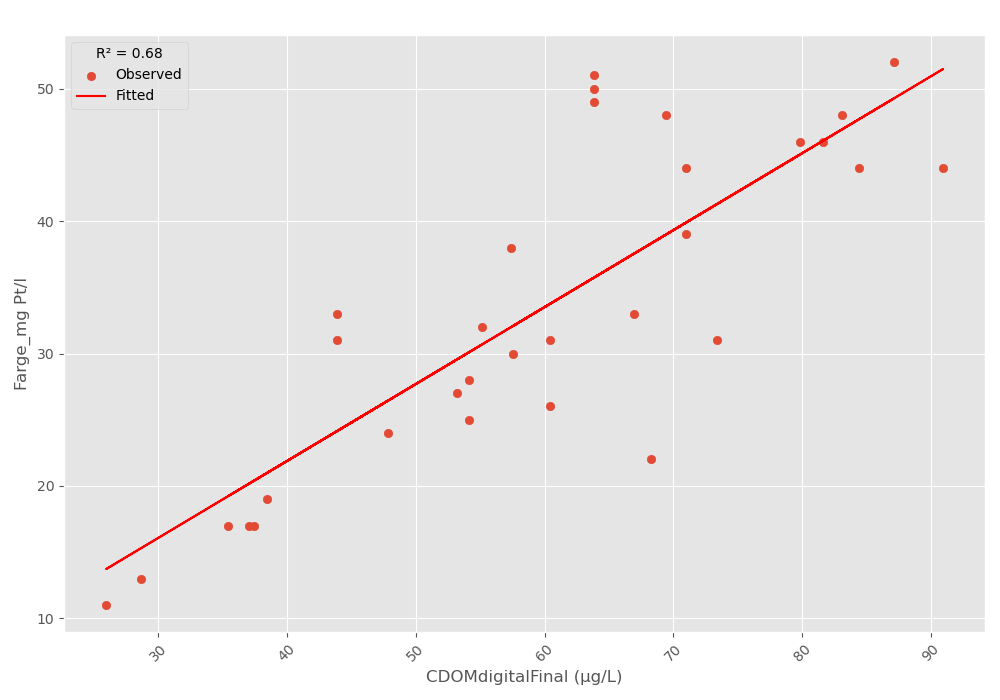

{('Farge_mg Pt/l', 'CDOMdigitalFinal (µg/L)'): [0.6785617004656879, 0.5810620961937265, -1.3631977089334075]}


In [19]:
# Variables of interest
wc_var = 'Farge_mg Pt/l' #'UV-Abs. 410nm_Abs/cm'
sensor_var = 'CDOMdigitalFinal (µg/L)'

# Initialize dictionary to store model coefficients and R-squared values
model_r2_coeffs = {}


fig, ax = plt.subplots(figsize=(10, 7))
    
# Filter the DataFrame for the variables of interest and drop missing values
df_reg = merged_df[[wc_var, sensor_var]].dropna()
    
if not merged_df.empty:
    X = sm.add_constant(df_reg[sensor_var])  # independent variable
    y = df_reg[wc_var]  # dependent variable
        
    model = sm.OLS(y, X)
    results = model.fit()
        
    m, c = results.params[sensor_var], results.params['const']
    model_r2_coeffs[(wc_var, sensor_var)] = [results.rsquared, m, c]
        
    ax.scatter(df_reg[sensor_var], df_reg[wc_var], label='Observed')
    ax.plot(df_reg[sensor_var], results.fittedvalues, color='red', label='Fitted')
    ax.set_xlabel(sensor_var)
    ax.set_ylabel(wc_var)
    r2 = results.rsquared
    ax.legend(title=f'R² = {r2:.2f}')
    ax.tick_params(axis='x', rotation=45) 
    
plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()

print(model_r2_coeffs)

**Leah:** The UV-Abs vs CDOM regression is ok, but actually not as nice as I would have hoped. I wonder whether that's a problem with the CDOM or the UVAbs, or whether it's just that CDOM is measuring a different part of the spectrum. Quick question: does farge vs CDOM look any better? How about farge vs UV-Abs? Just trying to figure out which of these variables are untrustworthy...

### 8. Parameters of interest 

After looking into the data we ended up with the following key chemical species: TSM, TOC, DIN, Farge, PO4-P, SiO2, TOTN, TOTP - filtered, TOTP - unfiltered. UV-Abs. 410nm_Abs/cm is included only for comparisons with the sensor data in Glomma.

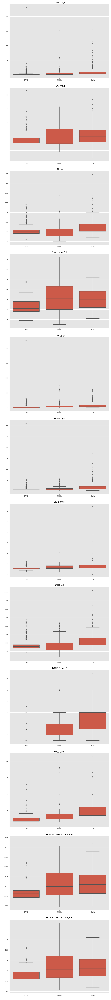

In [20]:
pars = ['TSM_mg/l', 'TOC_mg/l', 'DIN_μg/l', 'Farge_mg Pt/l', 'PO4-P_µg/l', 'TOTP_µg/l',
        'SiO2_mg/l', 'TOTN_µg/l', 'TOTP/F_µg/l P', 'TOTP_P_µg/l P', 'UV-Abs. 410nm_Abs/cm', 'UV-Abs. 254nm_Abs/cm']

fig, axes = plt.subplots(nrows=len(pars), ncols=1, figsize=(10, len(variables) * 6))
for i, par in enumerate(pars):
    sns.boxplot(x='station_code', y=par, data=wc_df, ax=axes[i])
    axes[i].set_title(f'{par}')
    axes[i].set_xlabel(' ')
    axes[i].set_ylabel(' ')

plt.tight_layout()
plt.show()

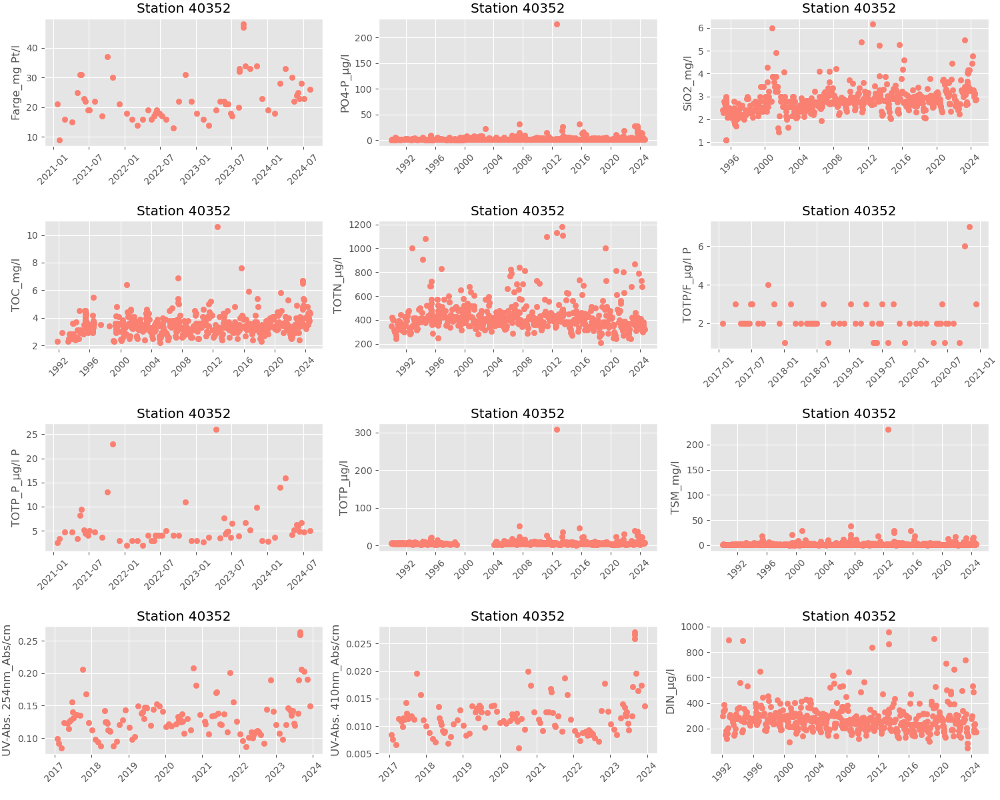

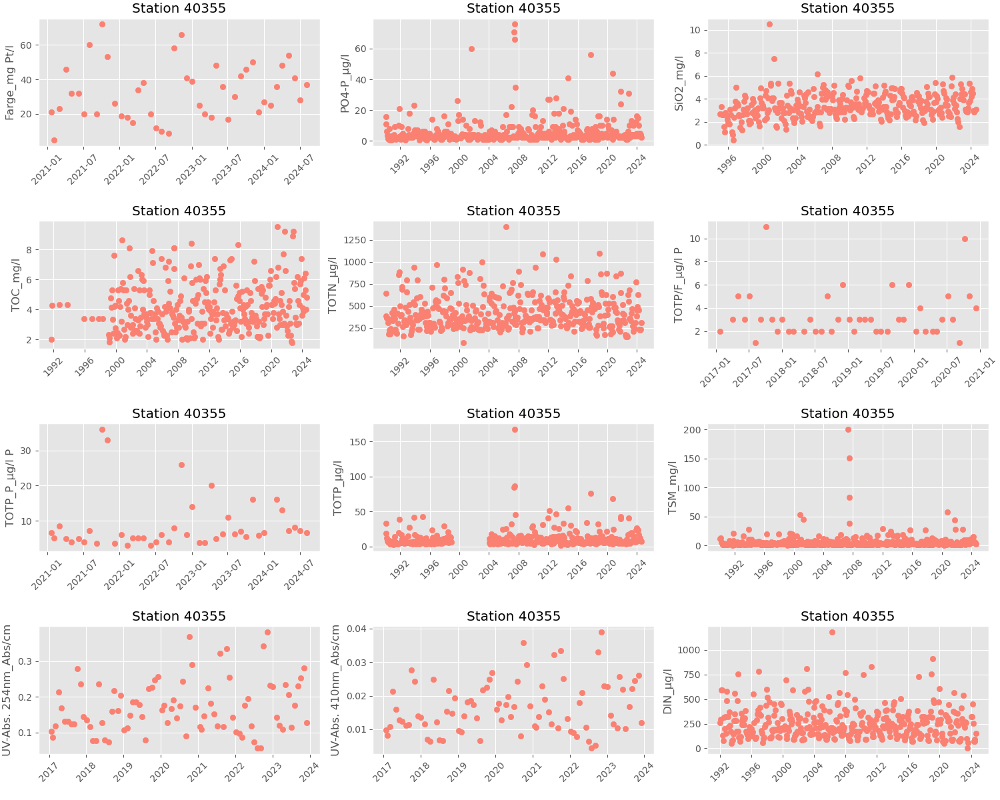

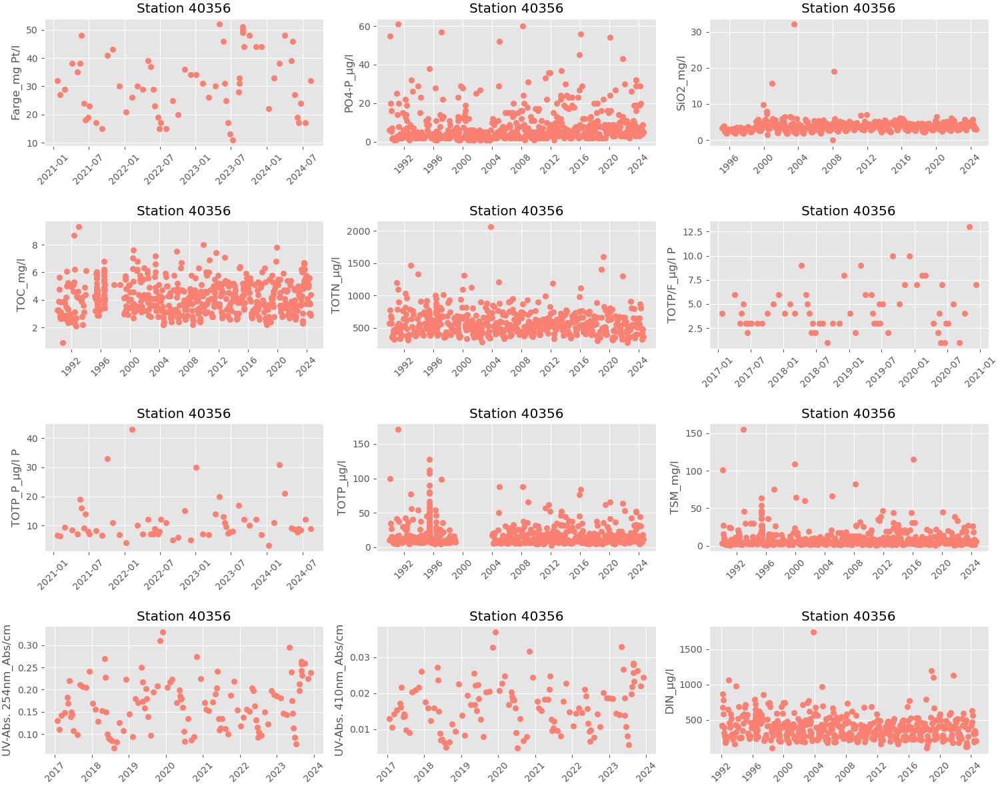

In [21]:
# Station Variable Scatter Plots
stations = wc_df["station_id"].unique()

num_cols = 3

for station in stations:
    station_df = wc_df[wc_df["station_id"] == station]
    
    variables = [col for col in station_df.columns 
                 if col not in ["station_id", "station_code", "station_name", "sample_date"] 
                 and "outlier" not in col]
    
    num_rows = (len(variables) + num_cols - 1) // num_cols
    
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 3), constrained_layout=True)
    
    axes = axes.flatten()
    
    for i, var in enumerate(variables):
        ax = axes[i]
        ax.scatter(station_df["sample_date"], station_df[var], marker='o', color='salmon')
        ax.set_title(f"Station {station}")
        ax.set_xlabel(" ")
        ax.set_ylabel(var)
        ax.tick_params(axis='x', rotation=45)
       
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    # plt.savefig("test_{}.png".format(station), format="png", dpi=300, bbox_inches='tight')
    plt.show()

In [22]:
# Save as csv
wc_df.to_csv('../../data/river/water_chem/cleaned_niva/dremmen_glomma_numed_key_wc_species_flaged_2024.csv', index=False)

### 9. Remove outliers manualy 
After a quick visual inspection, we can clearly see some outliers. Some values have already been flagged using the MAD (Median Absolute Deviation) function; however, this method does not always work perfectly. I am replacing the outliers with NaN and saving the result in a separate file.

In [23]:
wc_df.loc[(wc_df['station_id'] == 40352) & (wc_df['PO4-P_µg/l'] > 200), ['PO4-P_µg/l']] = np.nan
wc_df.loc[(wc_df['station_id'] == 40352) & (wc_df['TOC_mg/l'] > 10), ['TOC_mg/l']] = np.nan
wc_df.loc[(wc_df['station_id'] == 40352) & (wc_df['TSM_mg/l'] > 200), ['TSM_mg/l']] = np.nan
wc_df.loc[(wc_df['station_id'] == 40352) & (wc_df['TSM_mg/l'] < 0.7), ['TSM_mg/l']] = np.nan
wc_df.loc[(wc_df['station_id'] == 40352) & (wc_df['TOTP_µg/l'] > 300), ['TOTP_µg/l']] = np.nan
wc_df.loc[(wc_df['station_id'] == 40352) & (wc_df['TOTP_µg/l'] < 1.1), ['TOTP_µg/l']] = np.nan
wc_df.loc[(wc_df['station_id'] == 40352) & (wc_df['SiO2_mg/l'] < 1.5), ['SiO2_mg/l']] = np.nan
wc_df.loc[(wc_df['station_id'] == 40352) & (wc_df['DIN_μg/l'] < 50), ['DIN_μg/l']] = np.nan
wc_df.loc[(wc_df['station_id'] == 40352) & (wc_df['Farge_mg Pt/l'] < 10), ['Farge_mg Pt/l']] = np.nan

wc_df.loc[(wc_df['station_id'] == 40355) & (wc_df['PO4-P_µg/l'] > 60), ['PO4-P_µg/l']] = np.nan
wc_df.loc[(wc_df['station_id'] == 40355) & (wc_df['SiO2_mg/l'] > 6.5), ['SiO2_mg/l']] = np.nan
wc_df.loc[(wc_df['station_id'] == 40355) & (wc_df['SiO2_mg/l'] < 1), ['SiO2_mg/l']] = np.nan
wc_df.loc[(wc_df['station_id'] == 40355) & (wc_df['TOTN_µg/l'] > 1200), ['TOTN_µg/l']] = np.nan
wc_df.loc[(wc_df['station_id'] == 40355) & (wc_df['TOTN_µg/l'] < 150), ['TOTN_µg/l']] = np.nan
wc_df.loc[(wc_df['station_id'] == 40355) & (wc_df['TOTP_P_µg/l P'] > 30), ['TOTP_P_µg/l P']] = np.nan
wc_df.loc[(wc_df['station_id'] == 40355) & (wc_df['TSM_mg/l'] > 50), ['TSM_mg/l']] = np.nan
wc_df.loc[(wc_df['station_id'] == 40355) & (wc_df['TSM_mg/l'] < 0.6), ['TSM_mg/l']] = np.nan
wc_df.loc[(wc_df['station_id'] == 40355) & (wc_df['TOTP_µg/l'] > 150), ['TOTP_µg/l']] = np.nan
wc_df.loc[(wc_df['station_id'] == 40355) & (wc_df['DIN_μg/l'] < 5), ['DIN_μg/l']] = np.nan
wc_df.loc[(wc_df['station_id'] == 40355) & (wc_df['Farge_mg Pt/l'] < 6), ['Farge_mg Pt/l']] = np.nan
wc_df.loc[(wc_df['station_id'] == 40355) & (wc_df['sample_date'] < pd.Timestamp('1998-01-01')), 'TOC_mg/l'] = np.nan

wc_df.loc[(wc_df['station_id'] == 40356) & (wc_df['SiO2_mg/l'] > 10.5), ['SiO2_mg/l']] = np.nan
wc_df.loc[(wc_df['station_id'] == 40356) & (wc_df['SiO2_mg/l'] < 0.1), ['SiO2_mg/l']] = np.nan
wc_df.loc[(wc_df['station_id'] == 40356) & (wc_df['TOTN_µg/l'] > 2000), ['TOTN_µg/l']] = np.nan
wc_df.loc[(wc_df['station_id'] == 40356) & (wc_df['DIN_μg/l'] > 1500), ['DIN_μg/l']] = np.nan
wc_df.loc[(wc_df['station_id'] == 40356) & (wc_df['TOC_mg/l'] < 1), ['TOC_mg/l']] = np.nan

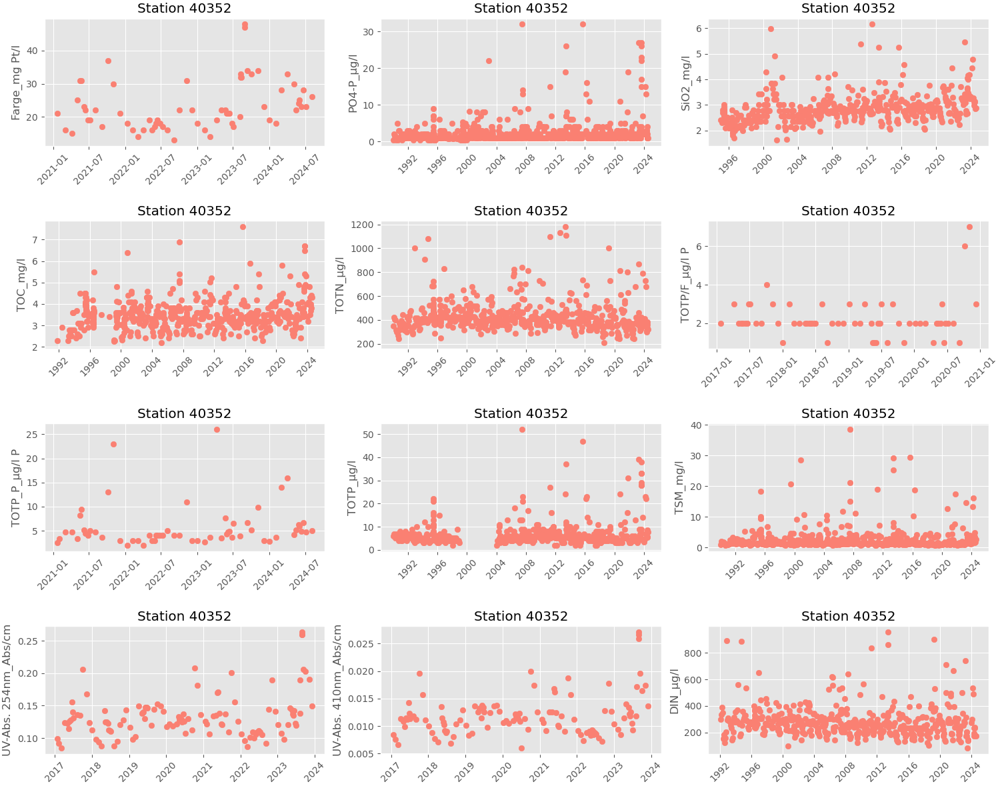

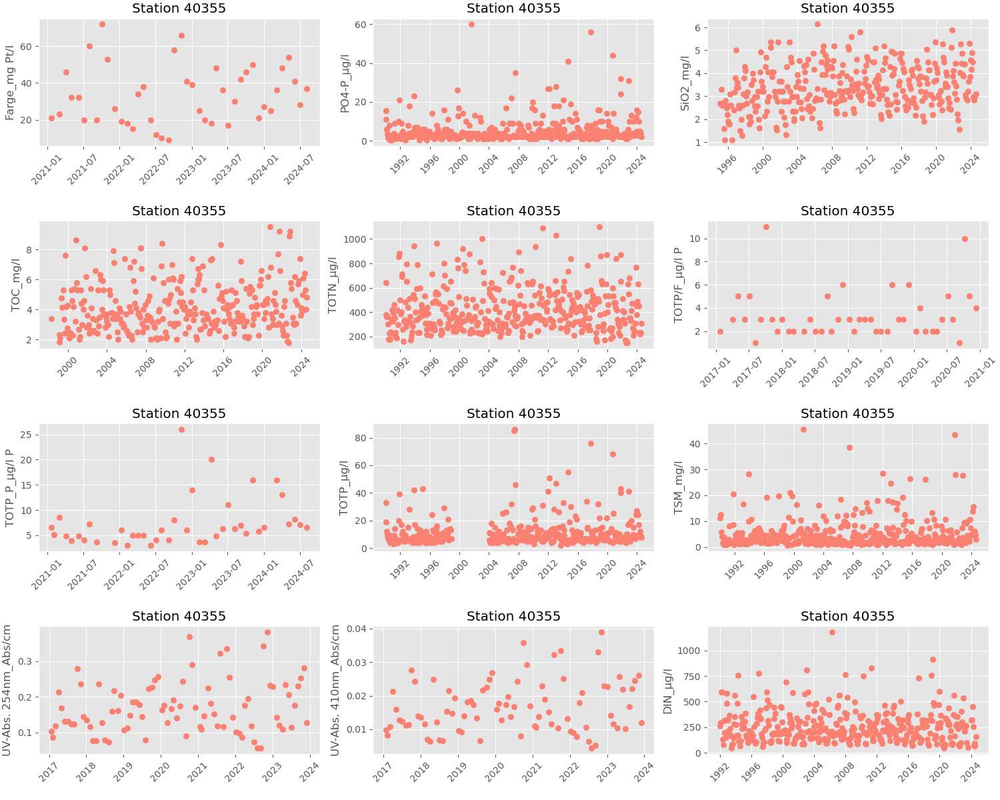

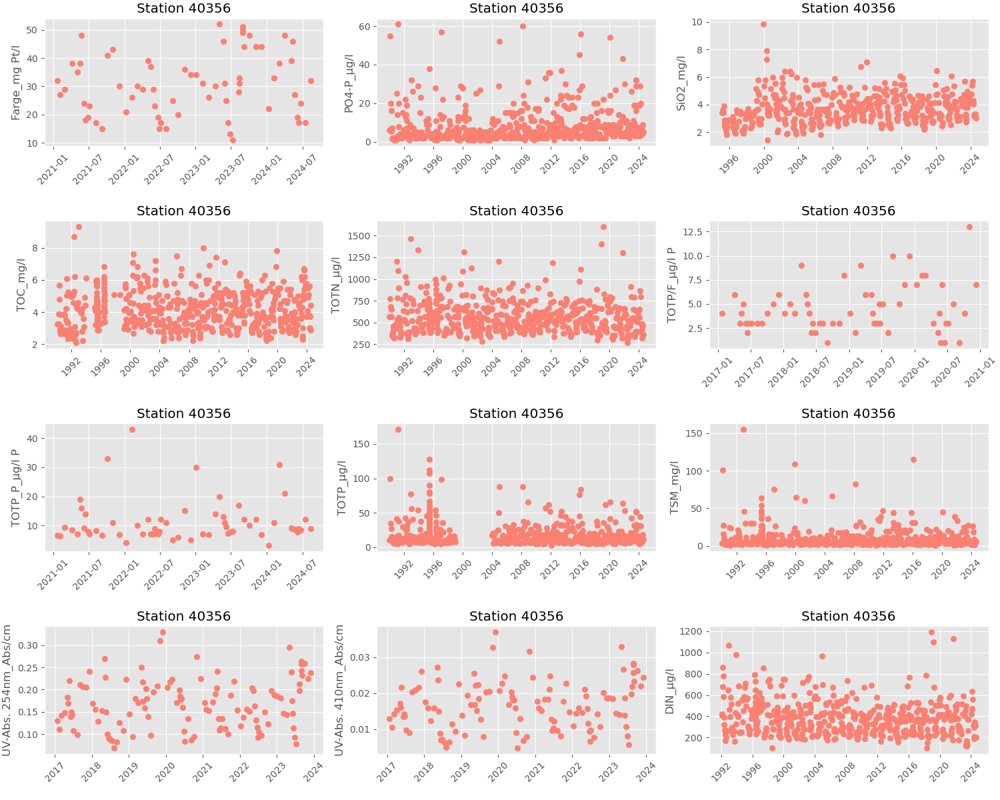

In [24]:
# Station Variable Scatter Plots
stations = wc_df["station_id"].unique()

num_cols = 3

for station in stations:
    station_df = wc_df[wc_df["station_id"] == station]
    
    variables = [col for col in station_df.columns 
                 if col not in ["station_id", "station_code", "station_name", "sample_date"] 
                 and "outlier" not in col]
    
    num_rows = (len(variables) + num_cols - 1) // num_cols
    
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 3), constrained_layout=True)
    
    axes = axes.flatten()
    
    for i, var in enumerate(variables):
        ax = axes[i]
        ax.scatter(station_df["sample_date"], station_df[var], marker='o', color='salmon')
        ax.set_title(f"Station {station}")
        ax.set_xlabel(" ")
        ax.set_ylabel(var)
        ax.tick_params(axis='x', rotation=45)
       
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])
    
    plt.show()

In [25]:
wc_df.head()

,station_id,station_code,station_name,sample_date,Farge_mg Pt/l,outlier_Farge_mg Pt/l,PO4-P_µg/l,outlier_PO4-P_µg/l,SiO2_mg/l,outlier_SiO2_mg/l,...,TOTP_µg/l,outlier_TOTP_µg/l,TSM_mg/l,outlier_TSM_mg/l,UV-Abs. 254nm_Abs/cm,outlier_UV-Abs. 254nm_Abs/cm,UV-Abs. 410nm_Abs/cm,outlier_UV-Abs. 410nm_Abs/cm,DIN_μg/l,outlier_DIN_μg/l
0,40352,DRA1,Drammenselva v/Krokstadelva,1990-01-11,NaN,NaN,0.5,False,NaN,NaN,...,6.0,False,0.8,False,NaN,NaN,NaN,NaN,NaN,False
1,40352,DRA1,Drammenselva v/Krokstadelva,1990-02-12,NaN,NaN,2.0,False,NaN,NaN,...,7.0,False,2.0,False,NaN,NaN,NaN,NaN,NaN,False
2,40352,DRA1,Drammenselva v/Krokstadelva,1990-03-13,NaN,NaN,1.5,False,NaN,NaN,...,6.0,False,1.4,False,NaN,NaN,NaN,NaN,NaN,False
3,40352,DRA1,Drammenselva v/Krokstadelva,1990-04-18,NaN,NaN,1.5,False,NaN,NaN,...,5.0,False,1.3,False,NaN,NaN,NaN,NaN,NaN,False
4,40352,DRA1,Drammenselva v/Krokstadelva,1990-05-21,NaN,NaN,0.5,False,NaN,NaN,...,6.0,False,1.7,False,NaN,NaN,NaN,NaN,NaN,False


In [26]:
# Save as csv
wc_df.to_csv('../../data/river/water_chem/cleaned_niva/dremmen_glomma_numed_key_wc_species_cleaned_manualy_2024.csv', index=False)